In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.impute import KNNImputer

from ydata_profiling import ProfileReport
from unicodedata import normalize
import seaborn as sns


In [2]:
#leer los datos guardados
df = pd.read_csv(r'data/gapminder_final.csv')

In [3]:
df.head()

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate
0,Ireland,27595.091350,14.92,0.450024,74.9,1.633779e+09,51.000000,0.2,69.770394,80.557,1.700262,10.0,2051.802338,10.365070,59.900002,61.34
1,Albania,1914.996551,7.29,1.024736,57.4,2.237473e+08,42.099998,NaN,44.989947,76.918,NaN,9.0,636.341383,7.699330,51.400002,46.72
2,Central African Rep.,239.518749,3.17,0.148659,16.5,8.338000e+06,62.900002,4.7,2.300027,48.398,NaN,-1.0,NaN,13.548420,71.300003,38.58
3,Barbados,9243.587053,6.42,0.663956,62.5,3.616067e+07,60.299999,1.4,70.028599,76.835,NaN,NaN,NaN,3.108603,66.900002,39.84
4,Italy,18982.269290,9.72,1.729346,74.4,1.900045e+10,35.799999,0.3,53.740217,81.855,1.207250,10.0,1176.385457,4.930045,46.400002,68.08


In [4]:
#tipos de datos:
df.dtypes

country                  object
incomeperperson         float64
alcconsumption          float64
armedforcesrate         float64
breastcancerper100th    float64
co2emissions            float64
femaleemployrate        float64
hivrate                 float64
internetuserate         float64
lifeexpectancy          float64
oilperperson            float64
polityscore             float64
relectricperperson      float64
suicideper100th         float64
employrate              float64
urbanrate               float64
dtype: object

In [5]:
df.shape

(178, 16)

Los datos, todos con excepción del país, fueron reconocidos como números.
según el diccionario:
 * incomeperperson es el PIB para el 2010. Esta es la variable objetivo que se tendrá en cuenta
 

In [6]:
#se eliminan duplicados.
df.drop_duplicates(inplace = True)
#se elimina la fila donde incomeperperson esté nulo
df = df.drop(df[df['incomeperperson'].isnull()].index)

In [7]:
df.shape

(163, 16)

**income per person**, la variable objetivo, se encuentra con valores nulos en el 2.1% de los registros. Estos registros se eliminarán ya que no hay información con la cual complementarlo

muchas de las demás variables muestran una alta correlación, sin embargo la columna **oilperperson** tiene una cantidad significativa de valores nulos (62.7%). Esta columna no será tenida en cuenta para el análisis.

También se encuentran filas duplicadas que agregarían ruido al modelo, estas se eliminarán.

Se agregará la información de la región y de su estado (desarrollado, en desarrollo)


In [8]:
c_status = pd.read_csv(r'data/Country-region.csv', sep = ';')
c_status['Country'] = c_status['Country'].str.capitalize()
c_status.head()

,Country,Continent,Development Status
0,Albania,Europe,Developing
1,Algeria,Africa,Developing
2,Angola,Africa,Developing
3,Argentina,South America,Developing
4,Armenia,Asia,Developing


In [9]:
#Se extrae la info antes de la ',' porque el archivo no la trae
df['country'] = df['country'].str.extract(r'^(.*?)(?:,|$)')
#se capitaliza
df['country'] = df['country'].str.capitalize()
#se hace el merge de los 2 archivos
df = pd.merge(df,c_status, how="left", left_on='country',  right_on='Country')
df.drop(['Country'], axis=1, inplace=True)
df.head()

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,oilperperson,polityscore,relectricperperson,suicideper100th,employrate,urbanrate,Continent,Development Status
0,Ireland,27595.091350,14.92,0.450024,74.9,1.633779e+09,51.000000,0.2,69.770394,80.557,1.700262,10.0,2051.802338,10.365070,59.900002,61.34,Europe,Developed
1,Albania,1914.996551,7.29,1.024736,57.4,2.237473e+08,42.099998,NaN,44.989947,76.918,NaN,9.0,636.341383,7.699330,51.400002,46.72,Europe,Developing
2,Central african rep.,239.518749,3.17,0.148659,16.5,8.338000e+06,62.900002,4.7,2.300027,48.398,NaN,-1.0,NaN,13.548420,71.300003,38.58,Africa,Developing
3,Barbados,9243.587053,6.42,0.663956,62.5,3.616067e+07,60.299999,1.4,70.028599,76.835,NaN,NaN,NaN,3.108603,66.900002,39.84,Caribbean,Developing
4,Italy,18982.269290,9.72,1.729346,74.4,1.900045e+10,35.799999,0.3,53.740217,81.855,1.207250,10.0,1176.385457,4.930045,46.400002,68.08,Europe,Developed


In [10]:
#se realiza la separación entre train y test para evitar data snooping. Se asigna un random state para que sea replicable
train, test = train_test_split(df, test_size=0.2, random_state=24)

In [11]:
print(train.shape)
print(test.shape)

(130, 18)
(33, 18)


Se inicia el EDA. Inicialmente se utiliza el ydata-profiling para ver si posibles relaciones o campos con datos nulos/invalidos.

In [12]:
#se elimina la fila donde incomeperperson esté nulo
train = train.drop(train[train['incomeperperson'].isnull()].index)

In [13]:
#country. Se hace conteo para ver si hay algún duplicado.
train.groupby('country')['country'].count().sort_values(ascending=False)

country
Albania             1
Poland              1
Peru                1
Paraguay            1
Papua new guinea    1
                   ..
Dominican rep.      1
Djibouti            1
Czech rep.          1
Cyprus              1
Zimbabwe            1
Name: country, Length: 130, dtype: int64

In [14]:
#se eliminan duplicados.
train.drop_duplicates(inplace = True)

In [15]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
#validación de los nulos
train.isna().sum() *100 /len(train)

country                  0.000000
incomeperperson          0.000000
alcconsumption           0.000000
armedforcesrate          3.076923
breastcancerper100th     0.000000
co2emissions             1.538462
femaleemployrate         0.769231
hivrate                 11.538462
internetuserate          0.769231
lifeexpectancy           0.000000
oilperperson            63.076923
polityscore              6.923077
relectricperperson      20.769231
suicideper100th          0.000000
employrate               0.769231
urbanrate                0.000000
Continent                0.000000
Development Status       0.000000
dtype: float64

In [17]:
#se hace el drop de la columna oilperperson y relectricperperson  por su alto porcentaje de nulos.
#El resto de columnas con valores nulos se complementarán con la información de la muestra.

train.drop(['oilperperson','relectricperperson'], axis=1, inplace=True)

In [18]:
#se hace one-hot encode del continente y de si es desarrollado por lo que no hay nulos
def one_hot(df):
    df = pd.get_dummies(data = df, columns =['Continent', 'Development Status'], dtype=int)
   
    # Drop de las columnas que pueden ser redundantes
    df = df.drop([ 'Development Status_Developing', 'Continent_Central America'],axis = 1)
    return df

train = one_hot(train)
train.head()


,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,...,employrate,urbanrate,Continent_Africa,Continent_Asia,Continent_Caribbean,Continent_Europe,Continent_North America,Continent_Oceania,Continent_South America,Development Status_Developed
51,Spain,15461.758370,11.83,0.979537,50.9,1.082253e+10,41.700001,0.4,65.808554,81.404,...,52.500000,77.12,0,0,0,1,0,0,0,1
1,Albania,1914.996551,7.29,1.024736,57.4,2.237473e+08,42.099998,NaN,44.989947,76.918,...,51.400002,46.72,0,0,0,1,0,0,0,0
125,Brunei,17092.460000,1.86,4.683989,20.6,2.542063e+08,55.500000,NaN,49.989975,78.005,...,63.799999,74.82,0,1,0,0,0,0,0,0
101,Congo,1253.292015,4.46,0.771694,20.6,4.630633e+07,52.299999,3.4,4.999875,57.379,...,64.199997,61.34,1,0,0,0,0,0,0,0
17,Panama,5900.616944,7.30,0.750210,29.0,1.704047e+08,43.400002,0.9,42.747812,76.128,...,59.799999,73.20,0,0,0,0,0,0,0,0


In [19]:
#el df resultante tiene 134 filas y 13 columnas.
train.shape

(130, 22)

In [20]:
#Visualización de columnas vacias.
train[train.isnull().any(axis=1)]

,country,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,...,employrate,urbanrate,Continent_Africa,Continent_Asia,Continent_Caribbean,Continent_Europe,Continent_North America,Continent_Oceania,Continent_South America,Development Status_Developed
1,Albania,1914.996551,7.29,1.024736,57.4,2.237473e+08,42.099998,NaN,44.989947,76.918,...,51.400002,46.72,0,0,0,1,0,0,0,0
125,Brunei,17092.460000,1.86,4.683989,20.6,2.542063e+08,55.500000,NaN,49.989975,78.005,...,63.799999,74.82,0,1,0,0,0,0,0,0
104,Cyprus,15313.859350,8.84,2.454913,67.2,1.835350e+08,51.299999,NaN,53.024745,79.591,...,59.099998,69.90,0,0,0,1,0,0,0,1
144,Bhutan,1324.194906,0.54,NaN,21.8,6.024333e+06,39.900002,0.2,13.598876,67.185,...,58.400002,34.48,0,1,0,0,0,0,0,0
77,Iceland,33945.314420,7.38,0.066100,90.0,9.277033e+07,69.599998,0.3,95.638113,81.804,...,73.599998,92.26,0,0,0,1,0,0,0,1
13,Iraq,736.268054,0.47,7.737913,31.7,2.421918e+09,12.400000,NaN,2.471948,69.042,...,37.400002,66.60,0,1,0,0,0,0,0,0
93,Luxembourg,52301.587180,12.84,0.731336,82.5,5.920127e+08,45.900002,0.3,90.079527,79.963,...,53.500000,82.44,0,0,0,1,0,0,0,1
52,Syria,1525.780116,1.49,5.955847,44.8,1.436893e+09,16.700001,NaN,20.663156,75.850,...,44.799999,54.22,0,1,0,0,0,0,0,0
38,Suriname,2668.020519,6.56,1.058419,30.0,8.631700e+07,30.400000,1.0,31.568098,70.563,...,44.700001,74.92,0,0,0,0,0,0,1,0
62,Ethiopia,220.891248,4.10,0.361708,24.7,1.199587e+08,73.000000,NaN,0.749996,59.274,...,80.699997,17.00,1,0,0,0,0,0,0,0


In [21]:
#imputer, los países tienden a ser similares a otros países de la misma región y tiene más sentido buscar faltantes así.


imputer = KNNImputer(n_neighbors=5, metric='nan_euclidean')

# Fit and transform the data to impute missing values
data_imputed = imputer.fit_transform(train.loc[:, train.columns != 'country'])

# Convert back to a DataFrame
train2 = pd.DataFrame(data_imputed, columns=train.loc[:, train.columns != 'country'].columns)


In [22]:
train2.head()

,incomeperperson,alcconsumption,armedforcesrate,breastcancerper100th,co2emissions,femaleemployrate,hivrate,internetuserate,lifeexpectancy,polityscore,...,employrate,urbanrate,Continent_Africa,Continent_Asia,Continent_Caribbean,Continent_Europe,Continent_North America,Continent_Oceania,Continent_South America,Development Status_Developed
0,15461.758370,11.83,0.979537,50.9,1.082253e+10,41.700001,0.400,65.808554,81.404,10.0,...,52.500000,77.12,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1,1914.996551,7.29,1.024736,57.4,2.237473e+08,42.099998,5.940,44.989947,76.918,9.0,...,51.400002,46.72,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,17092.460000,1.86,4.683989,20.6,2.542063e+08,55.500000,5.472,49.989975,78.005,5.8,...,63.799999,74.82,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1253.292015,4.46,0.771694,20.6,4.630633e+07,52.299999,3.400,4.999875,57.379,-4.0,...,64.199997,61.34,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5900.616944,7.30,0.750210,29.0,1.704047e+08,43.400002,0.900,42.747812,76.128,9.0,...,59.799999,73.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


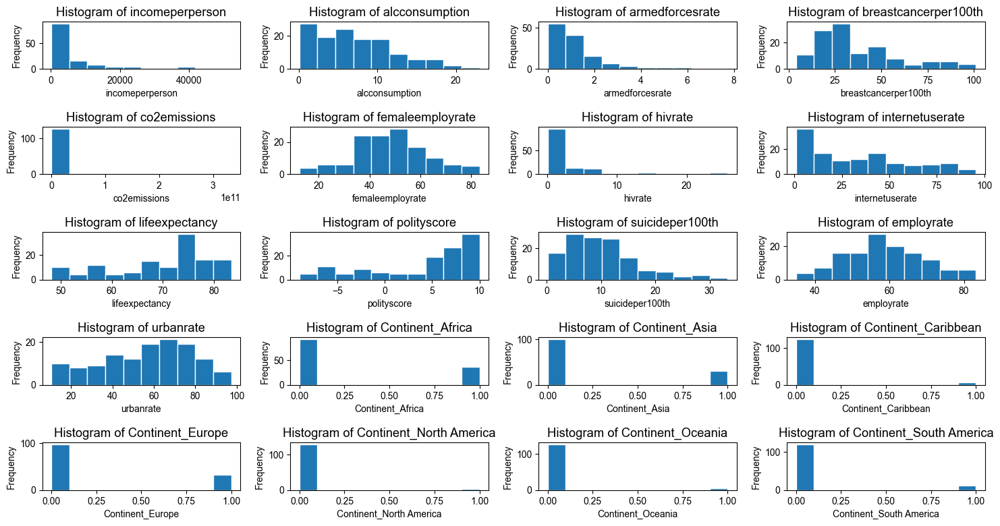

In [23]:
#Univariado: histogramas:

fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(15, 8))
sns.set(font_scale=1.1)

# Flatten the axes for easier iteration
axes = axes.ravel()

# Loop through each column and plot a histogram
for i, column in enumerate(train2.columns[0:20]):
    axes[i].hist(train2[column], bins=10)
    axes[i].set_title(f'Histogram of {column}')
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for i in range(len(train2.columns), len(axes)):
    fig.delaxes(axes[i])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

 Existen algunos campos donde la mayoría de los registros se encuentran muy cercanos con algunos outliers, es el caso de co2 emissions y el hiv rate. Employ rate aprece ser una distribución normal.

<Axes: >

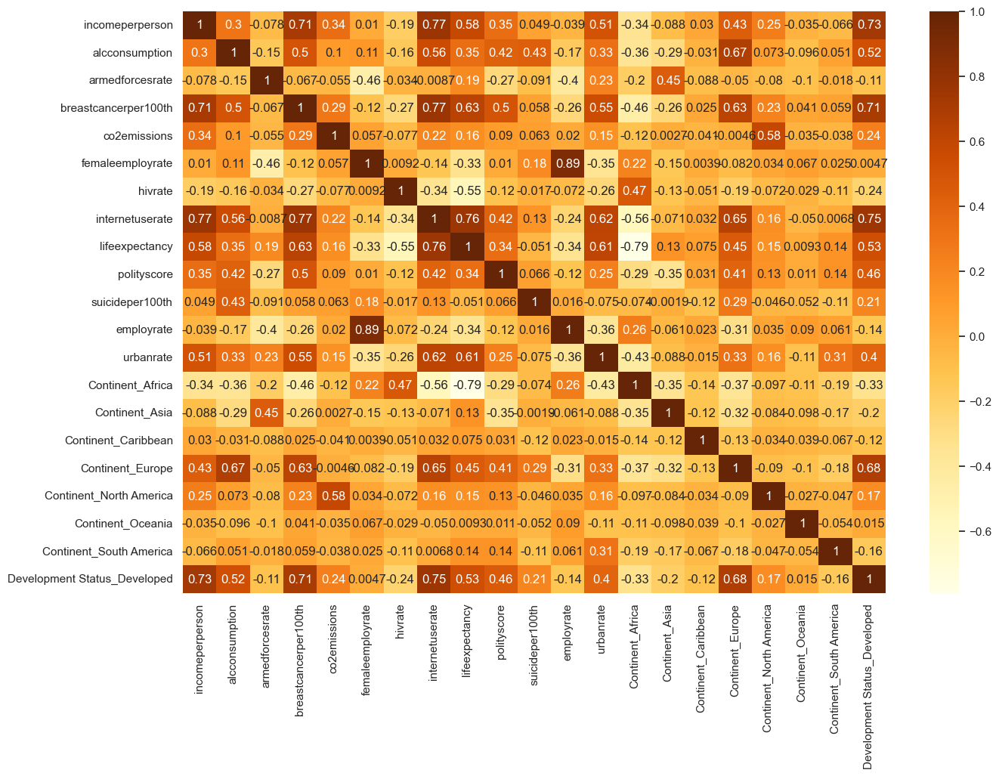

In [24]:
#bivariado: correlaciones:
plt.figure(figsize = (15, 10))
sns.set(font_scale=1)
sns.heatmap(train2.corr(numeric_only = True), annot=True, cmap = 'YlOrBr')


C:\Users\Juan D\.conda\envs\env\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2000x2000 with 0 Axes>

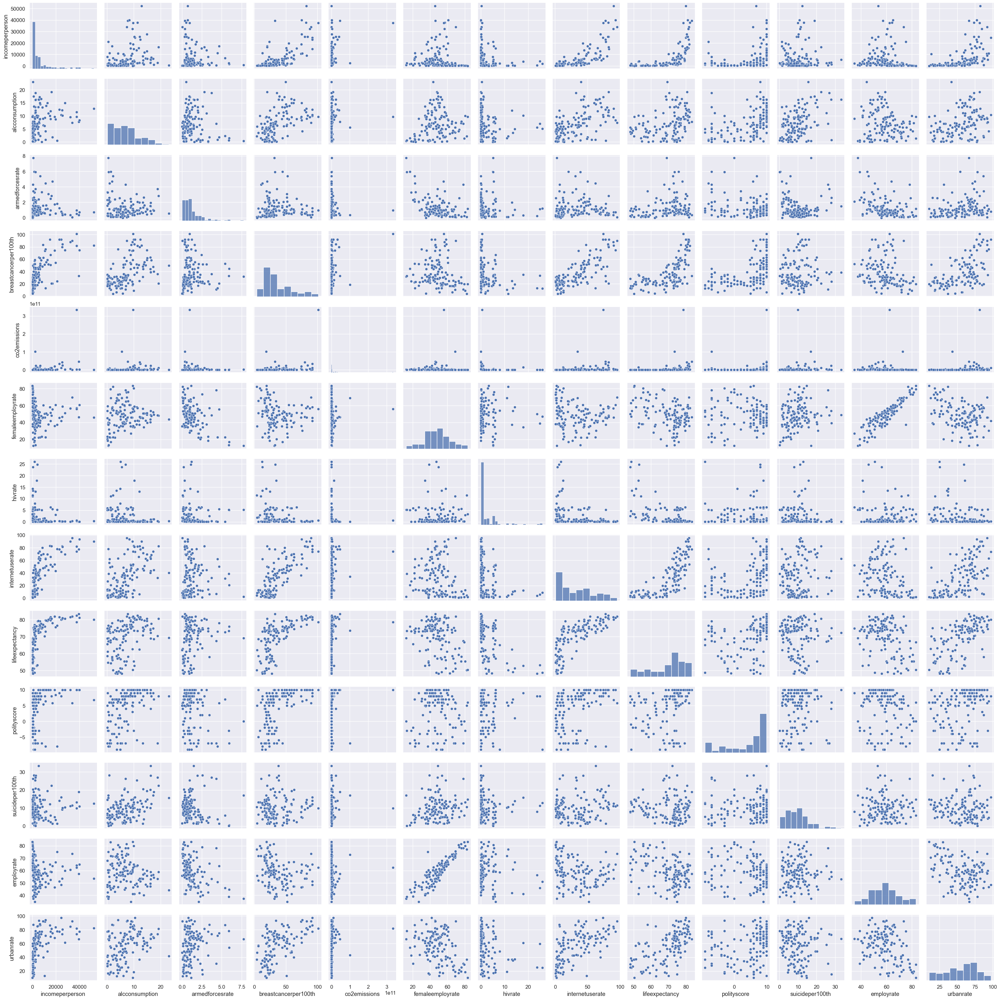

In [25]:
%matplotlib inline
plt.figure(figsize = (20, 20))
sns.set(font_scale=1.1)
sns.pairplot(train2.iloc[:,:13])



In [26]:
#se aplica una transformación a life expectancy (exp) para volverla lineal
train2['life_log'] = np.exp( train2['lifeexpectancy'])

C:\Users\Juan D\.conda\envs\env\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


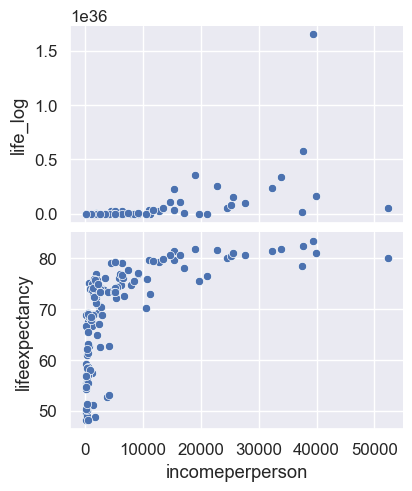

In [27]:
grap = sns.pairplot(train2
             ,x_vars = ['incomeperperson'],
             y_vars =['life_log', 'lifeexpectancy']
           )

grap.fig.set_size_inches(5,5)

### posibles columnas a tener en cuenta: 
* internetusagerate: mayor uso de internet puede indicar una mayor capacidad adquisitiva que estaría correlacionada con el pib
* lifeexpectancy: una mayor esperanza de vida indica que hay condiciones donde la gente puede llegar a vivir más ( buena salud, bajo crimen, etc).
* Development Status_Developed: la forma en la que se calcula si un país es desarrollado es mediante algunas medidas entre las que se encuentra si es desarrollado o no. Esto se ve en la tabla de correlaciones.
* urbanrate:
* polityscore
* suicideper100th: una baja tasa de suicidios podría indicar una mejor calidad de vida.

se elimina breastcancer porque parece estar correlacionado con el internetusagerate y femaleemployrate que está correlacionado con el employrate.

Obviamente si un país es desarrollado va a tener un mayor PIB

In [28]:
train2.columns.to_list()

['incomeperperson',
 'alcconsumption',
 'armedforcesrate',
 'breastcancerper100th',
 'co2emissions',
 'femaleemployrate',
 'hivrate',
 'internetuserate',
 'lifeexpectancy',
 'polityscore',
 'suicideper100th',
 'employrate',
 'urbanrate',
 'Continent_Africa',
 'Continent_Asia',
 'Continent_Caribbean',
 'Continent_Europe',
 'Continent_North America',
 'Continent_Oceania',
 'Continent_South America',
 'Development Status_Developed',
 'life_log']

In [29]:
y_train = train2['incomeperperson']
X_train = train2.drop(['incomeperperson', 'femaleemployrate', 'breastcancerper100th', 'lifeexpectancy'],axis=1)     

In [30]:
X_train.columns

Index(['alcconsumption', 'armedforcesrate', 'co2emissions', 'hivrate',
       'internetuserate', 'polityscore', 'suicideper100th', 'employrate',
       'urbanrate', 'Continent_Africa', 'Continent_Asia',
       'Continent_Caribbean', 'Continent_Europe', 'Continent_North America',
       'Continent_Oceania', 'Continent_South America',
       'Development Status_Developed', 'life_log'],
      dtype='object')

In [31]:
#normalización: Se normaliza para determinar los coeficientes más relevantes.
numeric_features = ['alcconsumption', 'armedforcesrate', 'co2emissions', 'internetuserate',
                    'polityscore', 'suicideper100th', 'employrate',
       'urbanrate', 'hivrate','life_log', 'Continent_Africa', 'Continent_Asia', 'Continent_Caribbean', 'Continent_Europe',
 'Continent_North America', 'Continent_Oceania', 'Continent_South America', 'Development Status_Developed']
scaler = StandardScaler()
X_train_norm = scaler.fit_transform(X_train[numeric_features])
X_train_norm = pd.DataFrame(X_train_norm,columns=numeric_features, index = X_train.index)
X_train_norm

,alcconsumption,armedforcesrate,co2emissions,internetuserate,polityscore,suicideper100th,employrate,urbanrate,hivrate,life_log,Continent_Africa,Continent_Asia,Continent_Caribbean,Continent_Europe,Continent_North America,Continent_Oceania,Continent_South America,Development Status_Developed
0,0.942861,-0.257698,0.142921,1.193272,0.989249,-0.644316,-0.590564,0.952142,-0.464502,1.169182,-0.630753,-0.547723,-0.219971,1.714466,-0.153695,-0.178174,-0.304034,1.908627
1,0.033749,-0.222863,-0.199314,0.421340,0.820568,-0.360816,-0.693437,-0.433485,0.715938,-0.211220,-0.630753,-0.547723,-0.219971,1.714466,-0.153695,-0.178174,-0.304034,-0.523937
2,-1.053581,2.597404,-0.198331,0.606736,0.280789,-1.351711,0.466224,0.847308,0.616219,-0.180308,-0.630753,1.825742,-0.219971,-0.583272,-0.153695,-0.178174,-0.304034,-0.523937
3,-0.532944,-0.417888,-0.205044,-1.061449,-1.372284,-0.020395,0.503632,0.232892,0.174726,-0.226948,1.585406,-0.547723,-0.219971,-0.583272,-0.153695,-0.178174,-0.304034,-0.523937
4,0.035751,-0.434446,-0.201037,0.338204,0.820568,-0.610374,0.092140,0.773469,-0.357964,-0.219810,-0.630753,-0.547723,-0.219971,-0.583272,-0.153695,-0.178174,-0.304034,-0.523937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,-0.719172,-0.743248,-0.204619,-0.181492,0.989249,-0.300979,-0.403522,-0.626744,-0.336657,-0.226494,1.585406,-0.547723,-0.219971,-0.583272,-0.153695,-0.178174,-0.304034,-0.523937
126,-1.321909,0.384266,-0.131765,1.645198,-2.047008,-1.348119,1.532365,0.986782,0.562524,-0.216106,-0.630753,1.825742,-0.219971,-0.583272,-0.153695,-0.178174,-0.304034,-0.523937
127,0.856756,0.562234,-0.104577,0.458294,0.820568,-0.123287,-1.076874,0.677751,-0.528425,-0.226495,-0.630753,-0.547723,-0.219971,1.714466,-0.153695,-0.178174,-0.304034,-0.523937
128,-0.410795,-0.912492,-0.205280,-0.987279,0.314525,-0.441361,0.671971,0.178196,-0.230119,-0.226948,1.585406,-0.547723,-0.219971,-0.583272,-0.153695,-0.178174,-0.304034,-0.523937


In [32]:
LinearModel = LinearRegression()
LinearModel.fit(X_train_norm, y_train)
print('Coefficients: ', LinearModel.coef_)
print('Intercept: ',LinearModel.intercept_)

Coefficients:  [-1926.18811277   135.13221616  1160.29589387  4699.42326101
    57.18137666  -217.40453567  1763.20601271  1732.18758405
  1167.32068322  2513.38885525  -558.10319116  -602.33542185
   409.58445213    78.11780171   303.9963426   -324.48022961
  -653.7249602   2777.8215661 ]
Intercept:  6696.299205598463


In [33]:
def Sort(sub_li):
    
    sub_li.sort( reverse = True,key = lambda x: x[1])
    return sub_li


coef = dict(zip(X_train_norm.columns, LinearModel.coef_))
a=[]
for k,v in coef.items():
    if k == 'life_log':
        a.append([k,np.log(v)])
    else:
        a.append([k,v])
coef = pd.DataFrame(Sort(a))

coef.rename(columns={coef.columns[0]:"variable"}, inplace =True)
coef.rename(columns={coef.columns[1]:"coeficiente"}, inplace =True)
#calcular los valores absolutos
coef['abs'] = coef['coeficiente'].abs()

lin_coef = coef.sort_values(by = 'abs', ascending =False)




In [34]:
y_pred = LinearModel.predict(X_train_norm)


In [35]:
#modelo normalizado
n,p = X_train_norm.shape

norm_train_mse =  mean_squared_error(y_train,y_pred)
norm_train_rmse =  mean_squared_error(y_train,y_pred) ** (1/2)
norm_train_r2 =  r2_score(y_train, y_pred) 
adj_norm_r2 =( 1-(1-r2_score(y_train, y_pred))*(n-1)/(n-p-1)) 
     

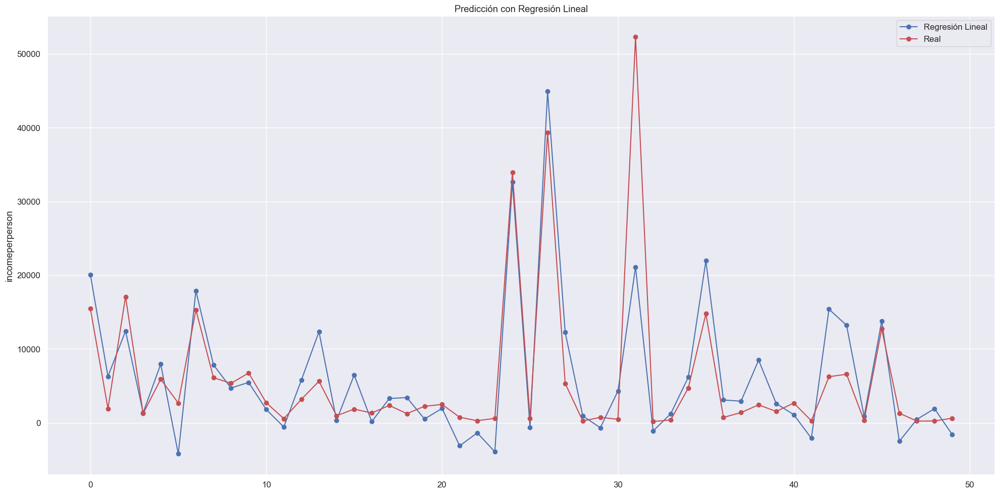

In [36]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_train[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()
     


## Modelo lasso

In [37]:
from sklearn.linear_model import Lasso

lasso_reg = Lasso(alpha = 2) #
lasso_reg.fit(X_train_norm, y_train)
print('Coefficients: ', lasso_reg.coef_)
print('Intercept: ',lasso_reg.intercept_)

Coefficients:  [-1917.93456526   128.74144939  1158.85336244  4698.89866391
    56.29963392  -217.20622583  1755.12479894  1730.59921078
  1161.02379333  2510.95356404  -540.42665835  -586.29357923
   412.98651383    82.17181751   306.12202312  -317.41977738
  -644.41026682  2778.57625321]
Intercept:  6696.299205598463


In [38]:
coef = dict(zip(X_train_norm.columns, lasso_reg.coef_))
a=[]
for k,v in coef.items():
    if k == 'life_log':
        a.append([k,np.log(v)])
    else:
        a.append([k,v])
coef=  pd.DataFrame(Sort(a))
coef.rename(columns={coef.columns[0]:"variable"}, inplace =True)
coef.rename(columns={coef.columns[1]:"coeficiente"}, inplace =True)
#calcular los valores absolutos

coef['abs'] = coef['coeficiente'].abs()

lasso_coef = coef.sort_values(by = 'abs', ascending =False)


In [39]:
y_pred = lasso_reg.predict(X_train_norm)

In [40]:
n,p = X_train_norm.shape


lasso_train_mse =  mean_squared_error(y_train,y_pred)
lasso_train_rmse =  mean_squared_error(y_train,y_pred) ** (1/2)
lasso_train_r2 =  r2_score(y_train, y_pred) 
lasso_norm_r2 =( 1-(1-r2_score(y_train, y_pred))*(n-1)/(n-p-1)) 

In [41]:
lasso_train_rmse

4536.433234042364

## se ajustan datos de test

In [42]:
train_col_list = train.columns.to_list()

In [43]:
test.drop_duplicates(inplace = True)

test = test.drop(test[test['incomeperperson'].isnull()].index)
test.drop(['oilperperson','relectricperperson'], axis=1, inplace=True)
#one_hot
test = one_hot(test)


# Validación de cols que se pudieron perder en el one_hot:
oh_cols = ['Continent_Africa', 'Continent_Asia', 'Continent_Caribbean', 'Continent_Europe', 'Continent_North America',
 'Continent_Oceania', 'Continent_South America', 'Development Status_Developed']

# Use the isin method to check if columns exist
cols_to_add = [col for col in oh_cols if col not in test.columns]

# Use the loc accessor to insert new columns
test.loc[:, cols_to_add] = 0
test = test[train_col_list]

#imputer
imputer_test = KNNImputer(n_neighbors=5, metric='nan_euclidean')
imputer_test.fit(train.loc[:, train.columns != 'country'])
data_imputed = imputer_test.transform(test.loc[:, test.columns != 'country'])
test2 = pd.DataFrame(data_imputed, columns=test.loc[:, test.columns != 'country'].columns)

test2['life_log'] = np.exp(test2['lifeexpectancy'])


y_test = test2['incomeperperson']
X_test = test2.drop(['incomeperperson', 'femaleemployrate', 'breastcancerper100th'],axis=1)     

## prueba test

In [44]:
#normalización

scaler = StandardScaler()
X_test_norm = scaler.fit_transform(X_test[numeric_features])
X_test_norm = pd.DataFrame(X_test_norm,columns=numeric_features, index = X_test.index)


In [45]:
y_pred = LinearModel.predict(X_test_norm)
y_pred

array([23628.53669286, -3195.77191537, -4582.16596428,  5457.53271211,
       11491.99857879,  1928.34700362,  -481.51556023, 24439.11788149,
       19690.88638054,  1335.69756853, 27439.89964028, 25139.65968134,
        1013.16271522,  1238.1596689 , -1107.54627491,  1828.07137787,
        -941.91082008, -1183.22362203, 25563.57809126,  -923.73523567,
       17895.62188987,  -402.88935116, 17794.45093124, -2317.77384935,
        1376.16785121, -4697.49502114,  2467.87215524,  8953.10151549,
        4718.72844735, 16798.38055199,  2893.48521986,  -560.39519548,
       -1720.1599606 ])

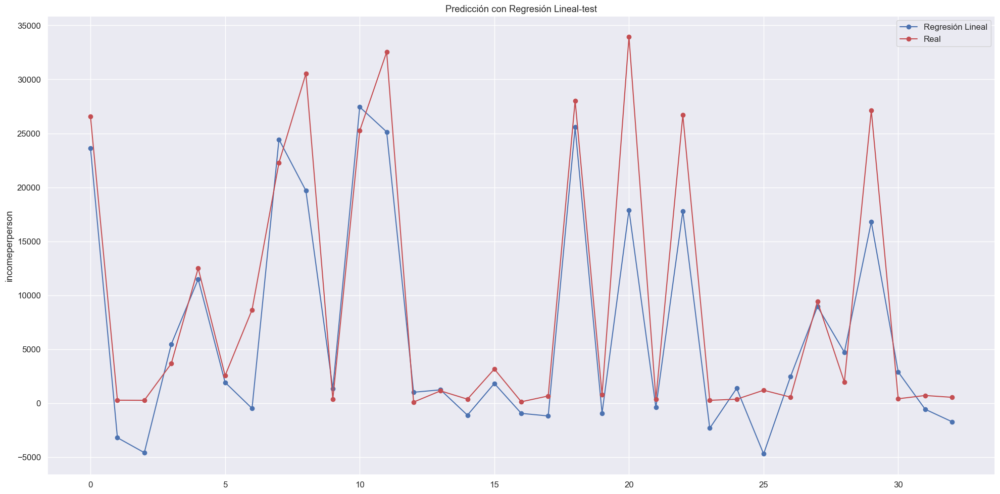

In [46]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_test[:50])))
axs.plot(xvals, y_pred[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_test[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal-test',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

In [47]:
#modelo normalizado
n,p = X_test.shape


norm_test_mse= mean_squared_error(y_test,y_pred)
norm_test_rmse = mean_squared_error(y_test,y_pred) ** (1/2)
norm_test_r2 =r2_score(y_test, y_pred) 


In [48]:
#lasso
y_pred = lasso_reg.predict(X_test_norm)
y_pred

array([23618.14642087, -3179.47695172, -4562.34545766,  5452.66796574,
       11472.17238443,  1900.82596808,  -477.9806678 , 24428.13367172,
       19684.5496604 ,  1337.79765685, 27452.48221261, 25119.4221069 ,
        1002.47547429,  1239.71646841, -1095.01663089,  1850.18709887,
        -964.16475628, -1173.94856165, 25555.34770821,  -914.14689531,
       17881.16987433,  -404.48986116, 17793.08192073, -2302.76182535,
        1361.16871253, -4659.77675537,  2467.29786855,  8943.48262502,
        4719.08493311, 16800.1371031 ,  2879.04891719,  -553.16844729,
       -1693.24615673])

In [49]:
#modelo lasso
n,p = X_test_norm.shape

lasso_test_mse= mean_squared_error(y_test,y_pred)
lasso_test_rmse = mean_squared_error(y_test,y_pred) ** (1/2)
lasso_test_r2 =r2_score(y_test, y_pred) 

# Resultado

In [50]:
d = {'Algoritmo': ['Reg. lineal', 'Lasso'],
     'MSE_train': ['{:.2f}'.format(norm_train_mse), '{:.2f}'.format(lasso_train_mse)],
     'RMSE_train': [norm_train_rmse,lasso_train_rmse],
     'R2_train': [norm_train_r2, lasso_train_r2],
     'MSE_test': ['{:.2f}'.format(norm_test_mse), '{:.2f}'.format(lasso_test_mse)],
     'RMSE_test': [norm_test_rmse, lasso_test_rmse],
     'R2_test': [norm_test_r2, lasso_test_r2]
}

pd.DataFrame(data=d)

,Algoritmo,MSE_train,RMSE_train,R2_train,MSE_test,RMSE_test,R2_test
0,Reg. lineal,20579073.12,4536.416330,0.791115,25561320.94,5055.820501,0.823698
1,Lasso,20579226.49,4536.433234,0.791113,25555499.99,5055.244801,0.823739


La regresión lineal fue la que tuvo el mejor desempeño. Los 5 coeficientes(variables) principales se muestran a continuación:

In [51]:
lasso_coef.head(5)

,variable,coeficiente,abs
0,internetuserate,4698.898664,4698.898664
1,Development Status_Developed,2778.576253,2778.576253
17,alcconsumption,-1917.934565,1917.934565
2,employrate,1755.124799,1755.124799
3,urbanrate,1730.599211,1730.599211
